In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import re
import random


from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import BernoulliNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
import sklearn.metrics
import sklearn.model_selection

In [ ]:
import pandas as pd
dataframe = pd.read_csv("voice.csv")
dataframe.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [ ]:
dataframe.count()

meanfreq    3168
sd          3168
median      3168
Q25         3168
Q75         3168
IQR         3168
skew        3168
kurt        3168
sp.ent      3168
sfm         3168
mode        3168
centroid    3168
meanfun     3168
minfun      3168
maxfun      3168
meandom     3168
mindom      3168
maxdom      3168
dfrange     3168
modindx     3168
label       3168
dtype: int64

Dataframe Properties
The following acoustic properties of each voice are measured and included in the dataset:

meanfreq: mean frequency (in kHz)
sd: standard deviation of frequency
median: median frequency (in kHz)
Q25: first quantile (in kHz)
Q75: third quantile (in kHz)
IQR: interquantile range (in kHz)
skew: skewness (see note in specprop description)
kurt: kurtosis (see note in specprop description)
sp.ent: spectral entropy
sfm: spectral flatness
mode: mode frequency
centroid: frequency centroid (see specprop)
peakf: peak frequency (frequency with highest energy)
meanfun: average of fundamental frequency measured across acoustic signal
minfun: minimum fundamental frequency measured across acoustic signal
maxfun: maximum fundamental frequency measured across acoustic signal
meandom: average of dominant frequency measured across acoustic signal
mindom: minimum of dominant frequency measured across acoustic signal
maxdom: maximum of dominant frequency measured across acoustic signal
dfrange: range of dominant frequency measured across acoustic signal
modindx: modulation index. Calculated as the accumulated absolute difference between adjacent measurements of fundamental frequencies divided by the frequency range
label: male or female

In [ ]:
dataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
meanfreq,3168.0,0.180907,0.029918,0.039363,0.163662,0.184838,0.199146,0.251124
sd,3168.0,0.057126,0.016652,0.018363,0.041954,0.059155,0.067020,0.115273
median,3168.0,0.185621,0.036360,0.010975,0.169593,0.190032,0.210618,0.261224
Q25,3168.0,0.140456,0.048680,0.000229,0.111087,0.140286,0.175939,0.247347
Q75,3168.0,0.224765,0.023639,0.042946,0.208747,0.225684,0.243660,0.273469
IQR,3168.0,0.084309,0.042783,0.014558,0.042560,0.094280,0.114175,0.252225
skew,3168.0,3.140168,4.240529,0.141735,1.649569,2.197101,2.931694,34.725453
kurt,3168.0,36.568461,134.928661,2.068455,5.669547,8.318463,13.648905,1309.612887
sp.ent,3168.0,0.895127,0.044980,0.738651,0.861811,0.901767,0.928713,0.981997
sfm,3168.0,0.408216,0.177521,0.036876,0.258041,0.396335,0.533676,0.842936


In [ ]:
#checking nulls
dataframe.isnull().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

Data Preprocessing
In this section our aim is to -

Perform Label Encoding on Target variable.
Shuffle our dataset.
Then split the data into training and validation sets. (80-20 split).

In [ ]:
dataframe.replace(to_replace="female", value=0, inplace=True)
dataframe.replace(to_replace="male", value=1, inplace=True)
dataframe.label.unique()

array([1, 0])

In [ ]:
#before shuffle
dataframe.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,1
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,1
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,1
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,1
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,1


In [ ]:
dataframe = dataframe.sample(frac=1).reset_index(drop=True)

In [ ]:
#after shuffle
dataframe.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.172346,0.072829,0.184861,0.097023,0.240908,0.143886,15.812252,348.989630,0.913021,0.486051,...,0.172346,0.075929,0.016327,0.231884,0.075758,0.070312,0.250000,0.179688,0.062500,1
1,0.166479,0.061180,0.181754,0.108684,0.202018,0.093333,2.481266,10.285962,0.916918,0.519853,...,0.166479,0.113172,0.047431,0.262295,0.711496,0.023438,6.093750,6.070312,0.142239,1
2,0.178254,0.053752,0.190419,0.117253,0.219028,0.101776,1.912809,6.834770,0.891691,0.296863,...,0.178254,0.114361,0.047244,0.277457,1.104226,0.023438,5.671875,5.648438,0.110749,1
3,0.163239,0.053881,0.172495,0.160134,0.188040,0.027906,3.498124,19.286248,0.881285,0.415102,...,0.163239,0.168612,0.054795,0.213333,0.695913,0.023438,6.929688,6.906250,0.151822,0
4,0.153817,0.058905,0.162708,0.102083,0.202292,0.100208,3.651088,19.951360,0.896026,0.445363,...,0.153817,0.105999,0.089286,0.263158,0.520601,0.092773,0.800781,0.708008,0.670115,1


Splitting into training and validation set
df_train - containing 2534 samples

df_val - containing 634 samples

In [ ]:
df_train = dataframe.iloc[:2534,:]
df_val = dataframe.iloc[2534:,:]

In [ ]:
print("Shape of training dataset :" ,df_train.shape)

Shape of training dataset : (2534, 21)


In [ ]:
#assigning x and y
X_train = df_train.iloc[:,:-1]
Y_train = df_train['label']

In [ ]:
X_val = df_val.iloc[:,:-1]
Y_val = df_val['label']

In [ ]:
print("Shape of X_train :" ,X_train.shape)
print("Shape of Y_train :" ,Y_train.shape)
print("Shape of X_val :" ,X_val.shape)
print("Shape of Y_val :" ,Y_val.shape)

Shape of X_train : (2534, 20)
Shape of Y_train : (2534,)
Shape of X_val : (634, 20)
Shape of Y_val : (634,)


Exploratory Data Analysis (EDA)
An approach to analyze the data using visual techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations.

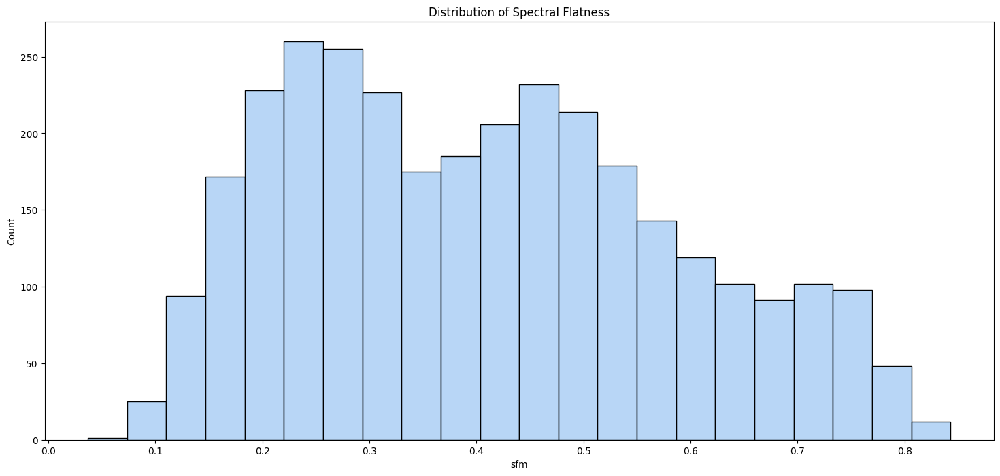

In [ ]:
plt.figure(figsize=(18,8))
sns.histplot(dataframe.sfm, color=sns.color_palette('pastel')[0])
plt.title("Distribution of Spectral Flatness")
plt.show()


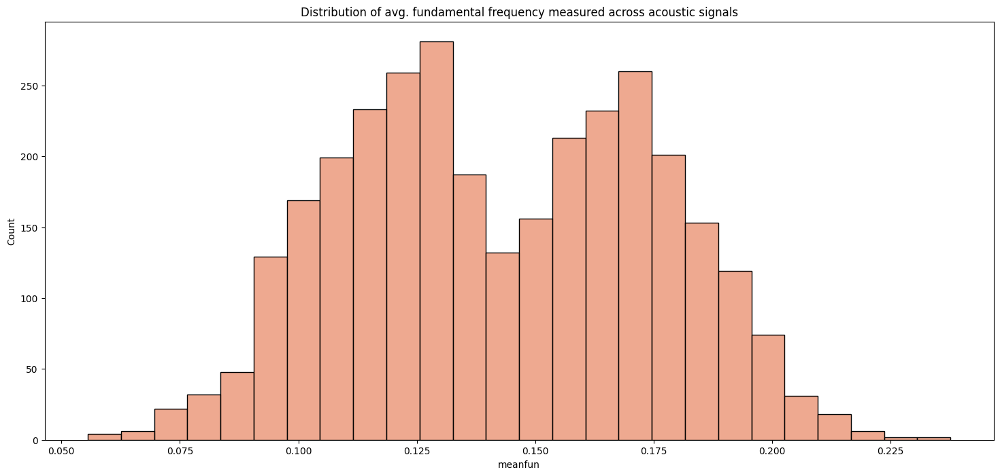

In [ ]:
plt.figure(figsize=(18,8))
sns.histplot(dataframe.meanfun, color=sns.color_palette('flare')[0])
plt.title("Distribution of avg. fundamental frequency measured across acoustic signals")
plt.show()

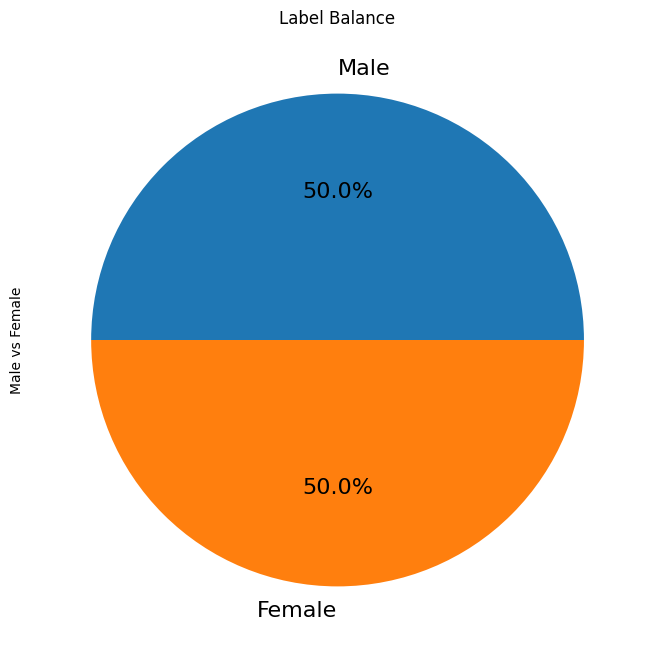

In [ ]:
#label balance verification

plt.figure(figsize=(18, 8))
dataframe.label.value_counts().plot(kind="pie",
                                           fontsize=16,
                                           labels=["Male", "Female"],
                                           ylabel="Male vs Female",
                                           autopct='%1.1f%%');
plt.title("Label Balance")
plt.show()

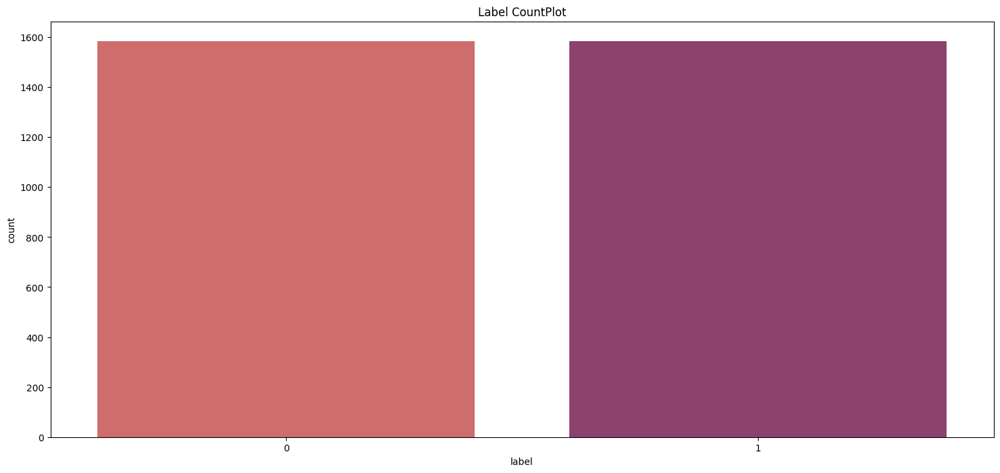

In [ ]:
plt.figure(figsize=(18, 8))
sns.countplot(x="label",data=dataframe, palette="flare")
plt.title("Label CountPlot")
plt.show()

Correlation Heatmap

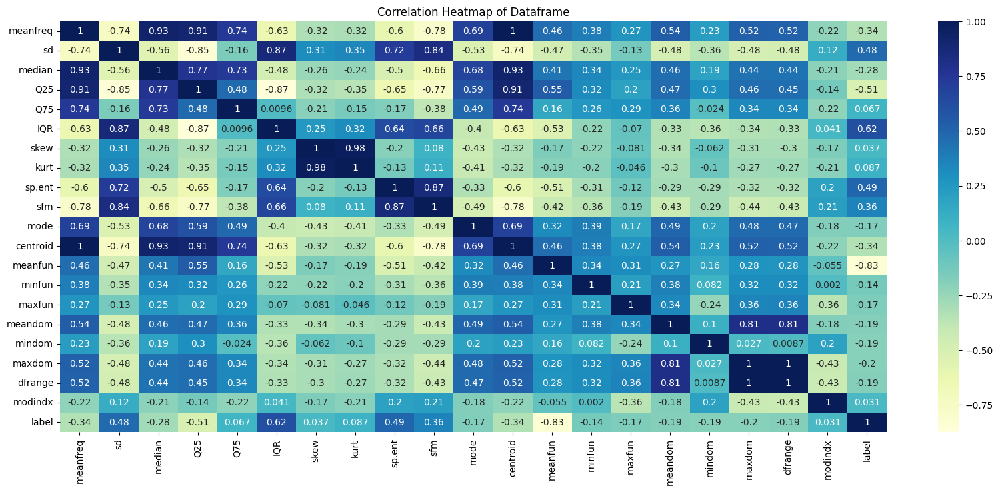

In [ ]:
plt.figure(figsize=(20, 8))
dataplot = sns.heatmap(dataframe.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation Heatmap of Dataframe")
plt.show()

Correlation Coefficient
A correlation coefficient is a numerical measure of some type of correlation, meaning a statistical relationship between two variables.

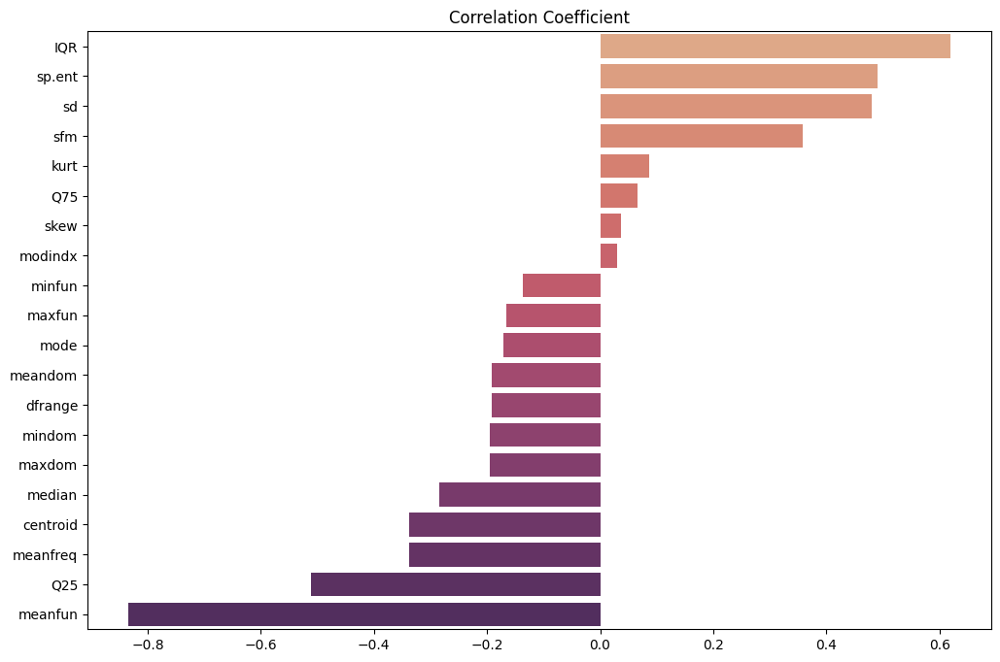

In [ ]:
plt.figure(figsize=(12,8))
data = dataframe.corr()["label"].sort_values(ascending=False)
indices = data.index
labels = []
corr = []
for i in range(1, len(indices)):
    labels.append(indices[i])
    corr.append(data[i])
sns.barplot(x=corr, y=labels, palette='flare')
plt.title('Correlation Coefficient')
plt.show()

ML Model Building
We approach the problem by building ML Models from simple to complex models on training set and then assess them on the basis of their scores on validation dataset.

Gaussian Naive Bayes

In [ ]:
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, Y_train)

GaussianNB()

In [ ]:
nb_val_accuracy = nb_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of Naive Bayes Classifier is: {(nb_val_accuracy)*100:.2f}%")

Validation Accuracy of Naive Bayes Classifier is: 88.64%


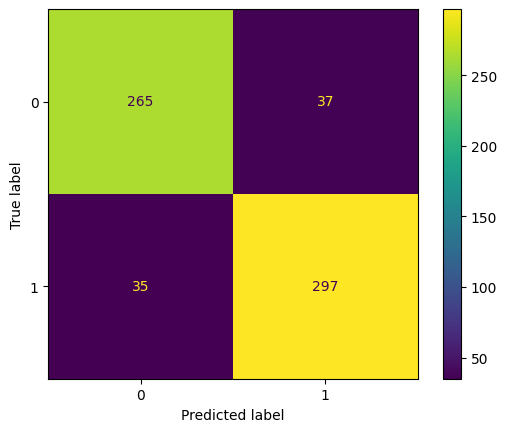

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(nb_classifier, X_val, Y_val)

Logistic Regression

In [ ]:
lr_classifier = LogisticRegression(solver='liblinear')
lr_classifier.fit(X_train, Y_train)

LogisticRegression(solver='liblinear')

In [ ]:
lr_val_accuracy = lr_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of Logisitic Regression Classifier is: {(lr_val_accuracy )*100:.2f}%")

Validation Accuracy of Logisitic Regression Classifier is: 90.38%


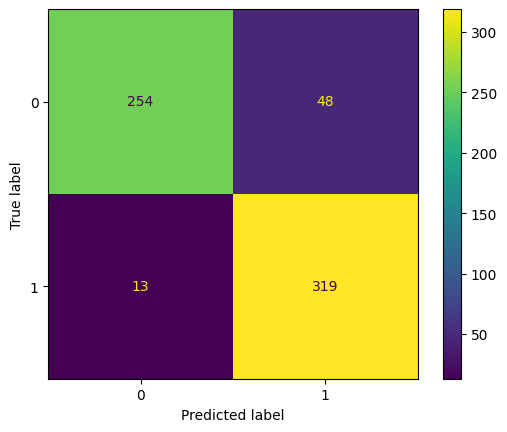

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(lr_classifier, X_val, Y_val)

KNN CLASSIFIER

In [ ]:
knn_classifier = KNeighborsClassifier(n_neighbors=3) # We always use odd numbers for this to avoid ties
knn_classifier.fit(X_train, Y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn_val_accuracy = knn_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of KNN Clf. is: {(knn_val_accuracy)*100:.2f}%")

Validation Accuracy of KNN Clf. is: 72.08%


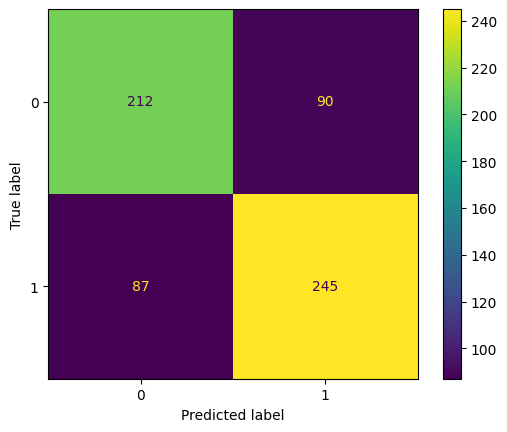

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(knn_classifier, X_val, Y_val)

sUPPORT vECTOR cLASSIFIER

In [ ]:
svc_classifier = SVC(kernel = 'linear')
svc_classifier.fit(X_train, Y_train)

SVC(kernel='linear')

In [ ]:
svc_val_accuracy = svc_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of Support Vector Classifier is: {(svc_val_accuracy)*100:.2f}%")

Validation Accuracy of Support Vector Classifier is: 92.27%


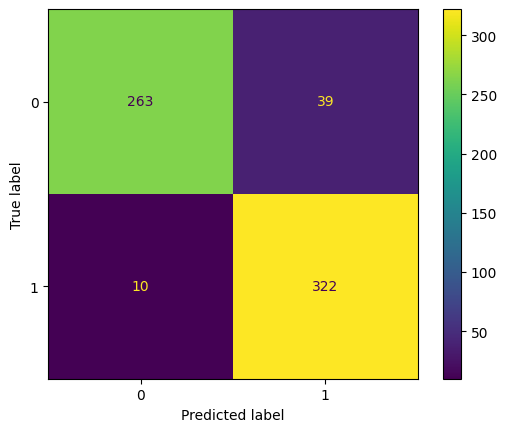

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(svc_classifier, X_val, Y_val)

DECISION TREE CLASSIFIER

In [ ]:
dt_classifier = DecisionTreeClassifier()
dt_classifier.fit(X_train, Y_train)

DecisionTreeClassifier()

In [ ]:
dt_val_accuracy = dt_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of Decision Tree Clf. is: {(dt_val_accuracy)*100:.2f}%")

Validation Accuracy of Decision Tree Clf. is: 97.16%


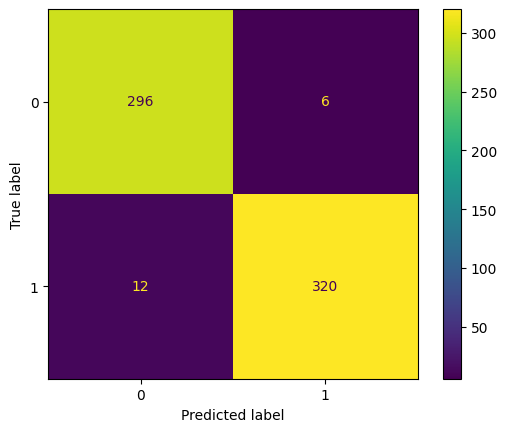

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(dt_classifier, X_val, Y_val)

RANDOM FOREST CLASSIFIER

In [ ]:
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, Y_train)

RandomForestClassifier()

In [ ]:
rf_val_accuracy = rf_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of Random Forest Classifier is: {(rf_val_accuracy)*100:.2f}%")

Validation Accuracy of Random Forest Classifier is: 98.11%


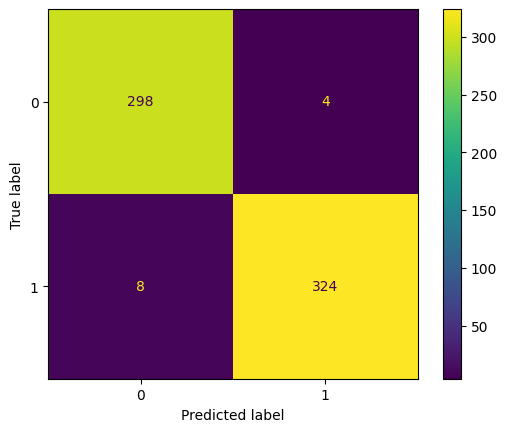

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(rf_classifier, X_val, Y_val)

mlp classifier

In [ ]:
mlp_classifier = MLPClassifier()
mlp_classifier.fit(X_train, Y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier()

In [ ]:
mlp_val_accuracy = mlp_classifier.score(X_val, Y_val)
print(f"Validation Accuracy of MLP Classifier is: {(mlp_val_accuracy)*100:.2f}%")

Validation Accuracy of MLP Classifier is: 94.64%


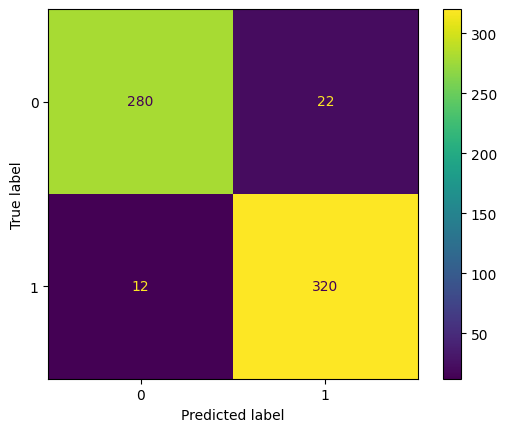

In [ ]:
sklearn.metrics.ConfusionMatrixDisplay.from_estimator(mlp_classifier, X_val, Y_val)

Scoring ML Model Performance
List of Validation Accuracies

In [ ]:
print(f"Validation Accuracy of Naive Bayes Classifier is: {(nb_val_accuracy)*100:.2f}%")
print(f"Validation Accuracy of Logisitic Regression is: {(lr_val_accuracy )*100:.2f}%")
print(f"Validation Accuracy of SVC is: {(svc_val_accuracy )*100:.2f}%")
print(f"Validation Accuracy of KNN Clf. is: {(knn_val_accuracy)*100:.2f}%")
print(f"Validation Accuracy of Decision Tree Clf. is: {(dt_val_accuracy)*100:.2f}%")
print(f"Validation Accuracy of Random Forest Classifier is: {(rf_val_accuracy)*100:.2f}%")
print(f"Validation Accuracy of MLP Classifier is: {(mlp_val_accuracy)*100:.2f}%")

Validation Accuracy of Naive Bayes Classifier is: 88.64%
Validation Accuracy of Logisitic Regression is: 90.38%
Validation Accuracy of SVC is: 92.27%
Validation Accuracy of KNN Clf. is: 72.08%
Validation Accuracy of Decision Tree Clf. is: 97.16%
Validation Accuracy of Random Forest Classifier is: 98.11%
Validation Accuracy of MLP Classifier is: 94.64%


Plottinh the same

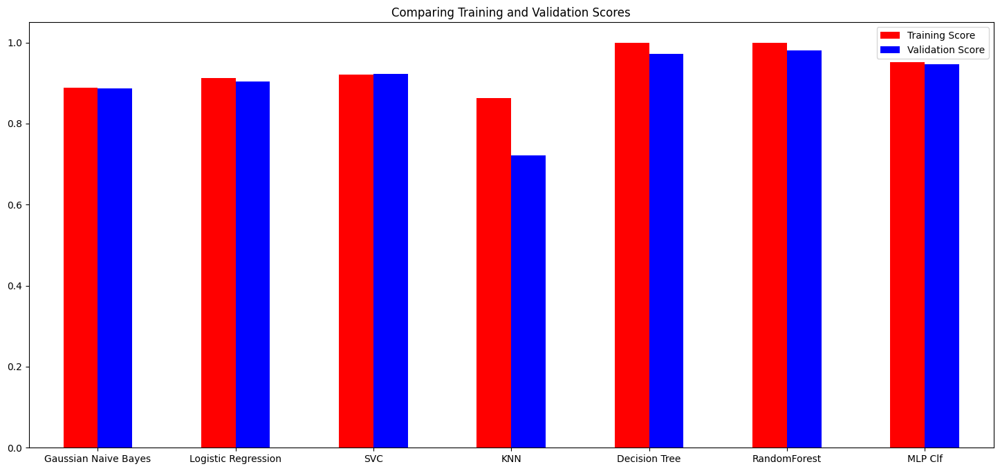

In [ ]:
trainScores = [nb_classifier.score(X_train, Y_train),lr_classifier.score(X_train, Y_train) ,svc_classifier.score(X_train, Y_train),knn_classifier.score(X_train, Y_train),dt_classifier.score(X_train, Y_train),rf_classifier.score(X_train, Y_train),mlp_classifier.score(X_train,Y_train)]
valScores = [nb_val_accuracy,lr_val_accuracy,svc_val_accuracy,knn_val_accuracy,dt_val_accuracy,rf_val_accuracy,mlp_val_accuracy]
indices = ['Gaussian Naive Bayes', 'Logistic Regression', 'SVC', 'KNN','Decision Tree', 'RandomForest', 'MLP Clf']
scores = pd.DataFrame({'Training Score': trainScores,'Validation Score': valScores}, index=indices)
plot = scores.plot.bar(figsize=(18, 8), rot=0, color=['red', 'blue'])
plt.title('Comparing Training and Validation Scores')
plt.show()

Conclusion
The following models performed the best -

Random Forest Classifier - 98.42%
Decision Tree Classifier - 95.74%
MLP(Multi-layer Perceptron) Classifier - 95.11%

Model Visualization
We look at our best performing model

In [ ]:
from sklearn.tree import export_graphviz

rf_classifier.fit(X_train, Y_train)
estimator = rf_classifier.estimators_[5]

export_graphviz(estimator,
                out_file='tree.dot',
                rounded = True, proportion = False,
                precision = 2, filled = True)


In [ ]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [ ]:
from IPython.display import Image
Image(filename = 'tree.png')